# Brisbane, Australia Sales Price Predictor (properties under $1m AUD)

## Project Context

For the last year I have been working in consultation with a built environment expert based in my hometown of Brisbane, Australia. The primary goal of the work was to collate analyse and develop models to identify under apricated development opportunities within Brisbane. The primary focus of this analysis was to combine real estate data with technical planning data. Over the course of the last year Chris (the client) and myself have been working to extract relevant planning data, and transform it for use for our purposes. A primary focus for our work currently, is to start utilizing the transformed and processed data to start testing our hypothesis’s around buying strategies. This algorithm represents the first attempt at using this data to investigate Brisbane’s property market. 

As such the research question for this algorithm is: “How well do the independent variables of locality, LGA, Days to sell, housing typology, area, bedrooms, bathrooms, carparks, previous valuation, zoning, character residential and flooding impact the dependent y variable of predicted sales price?”

The dependent variables used can be divided into two clear categories. Firstly, there are standard real estate variables that impact house price, these include: 
- Locality
- LGA
- Days to sell
- Housing typology
- Area (m2)
- Number of bedrooms
- Number of bathrooms
- Number of car parks
- Valuation amount

The second category is for variable relating to urban planning, they include:
- Zoning
- Character Housing overlay
- Flooding Overlay

It is also worth noting that for the purposes of this analysis the cap on sale price will be set at $1,000,000 as this is the range within which the client is interested in investing.

## Imports

The first step is to import all the required libraries for the model.

In [44]:
import sklearn as sk
from IPython.display import Image
import pandas as pd
import seaborn as sns
import math
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

#REF
# https://towardsdatascience.com/predicting-housing-prices-using-a-scikit-learns-random-forest-model-e736b59d56c5

# - Create quick and dirty poster
# - References


## Datasets Load and Clean

As previously stated, this model aims to predict sale price for properties sold in Brisbane. Ideally this will provide additional purchasing advice for the client. The first file brought in for the model is the real estate variables mentioned previously. This comes in in the form of 'Sales_Data.csv'.

In [2]:
#Double check the structure
df1 = pd.read_csv("Sales_Data2.csv")
df1.head()

/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (39,42) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,FULL_AD,FULL_AD2,Disclaimer,Building Name,Street Display,Alternate Street Display,Other,Unit,Number,Street Name,...,Government Number,Parent Government Number,PDS ID,Sale ID,Load Date,Property ID,Vendor Names,Vendor Address,Purchaser Names,Purchaser Address
0,"38 DOWSE ST, PADDINGTON","DOWSE ST, PADDINGTON",NaN,NaN,38 DOWSE ST,NaN,NaN,NaN,38.0,DOWSE ST,...,QLD40671314,NaN,144914.0,70172559.0,2.020050e+13,NaN,EMMA LOUISE ROBERTSON,"2 PLUNKETT STREET, PADDINGTON, QLD, 4064, AUS",SCULL INVESTMENT FUND PTY LTD,"129 TOWERS STREET, ASCOT, QLD, 4007, AUS"
1,"33 NURRAN ST, MOUNT GRAVATT EAST","NURRAN ST, MOUNT GRAVATT EAST",NaN,NaN,33 NURRAN ST,NaN,NaN,NaN,33.0,NURRAN ST,...,QLD9034743,NaN,33801.0,70006795.0,2.020040e+13,NaN,PETER WILLIAM GEAR,"47A MACAULAY STREET, COORPAROO, QLD, 4151, AUS",XIAOHONG YANG; LONGBIN HUANG,"22 HANRAHAN STREET, ROBERTSON, QLD, 4109, AUS"
2,"155 EDENBROOKE DR, SEVENTEEN MILE ROCKS","EDENBROOKE DR, SEVENTEEN MILE ROCKS",NaN,NaN,155 EDENBROOKE DR,NaN,NaN,NaN,155.0,EDENBROOKE DR,...,QLD40188838,NaN,346045.0,69915449.0,2.020032e+13,NaN,CHRISTOPHER JOHN & NAOMI JOY HICKS,"30 PETRIE WAY, IDALIA, QLD, 4811, AUS",HEINRICH VENTER,"155 EDENBROOKE DRIVE, SEVENTEEN MILE ROCKS, QL..."
3,"15 EDINBURGH CASTLE RD, KEDRON","EDINBURGH CASTLE RD, KEDRON",NaN,NaN,15 EDINBURGH CASTLE RD,NaN,NaN,NaN,15.0,EDINBURGH CASTLE RD,...,QLD1149290,NaN,154979.0,70007397.0,2.020040e+13,NaN,SIMON JAMES TATE; SUSAN CICELY PEARN,"20 ORMELEY STREET, STAFFORD HEIGHTS, QLD, 4053...",ALEXANDRA LAYNE & MADDISON ELIZABETH GEE,"15 EDINBURGH CASTLE ROAD, KEDRON, QLD, 4031, AUS"
4,"16 VENUS ST, ASHGROVE","VENUS ST, ASHGROVE",NaN,NaN,16 VENUS ST,NaN,NaN,NaN,16.0,VENUS ST,...,QLD1252133,NaN,295120.0,70173923.0,2.020050e+13,NaN,PAUL GORDON O`CONNOR; DIANNE HELEN MCCORMACK,"50 ROSEBERY STREET, CHELMER, QLD, 4068, AUS",BCN PROPERTY PTY LTD; GMJ PROPERTY (QLD) PTY L...,"47 BRISBANE STREET, ST LUCIA, QLD, 4067, AUS"


In [3]:
#Check the data available
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26905 entries, 0 to 26904
Data columns (total 63 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   FULL_AD                   26905 non-null  object 
 1   FULL_AD2                  26905 non-null  object 
 2   Disclaimer                6 non-null      object 
 3   Building Name             2770 non-null   object 
 4   Street Display            26887 non-null  object 
 5   Alternate Street Display  240 non-null    object 
 6   Other                     0 non-null      float64
 7   Unit                      6714 non-null   float64
 8   Number                    26865 non-null  float64
 9   Street Name               26887 non-null  object 
 10  Locality                  26887 non-null  object 
 11  Postcode                  26887 non-null  float64
 12  Alt. Street               240 non-null    object 
 13  Alt. Locality             200 non-null    object 
 14  Legal 

Looking at the data we begin to identify the key real estate variables mentioned previously, that are of interest to the client.

- Locality
- LGA
- Days to sell
- Housing typology
- Area (m2)
- Number of bedrooms
- Number of bathrooms
- Number of car parks
- Valuation amount

The planning data for this project was developed in coordination with the client. Planning data selected includes:
- Zoning
- Character Housing overlay
- Flooding Overlat

In order to apply these geospatial variables, some geospatial analysis was required to link them to the sales data. Using FME (a modeling program) geospatial addresses were intersected against city planning overlays for the Sales data. This provided us with a data set that includes the sales data addresses, coupled with the planning data intersects. To get a better idea of the processing required, see the image of the model below.

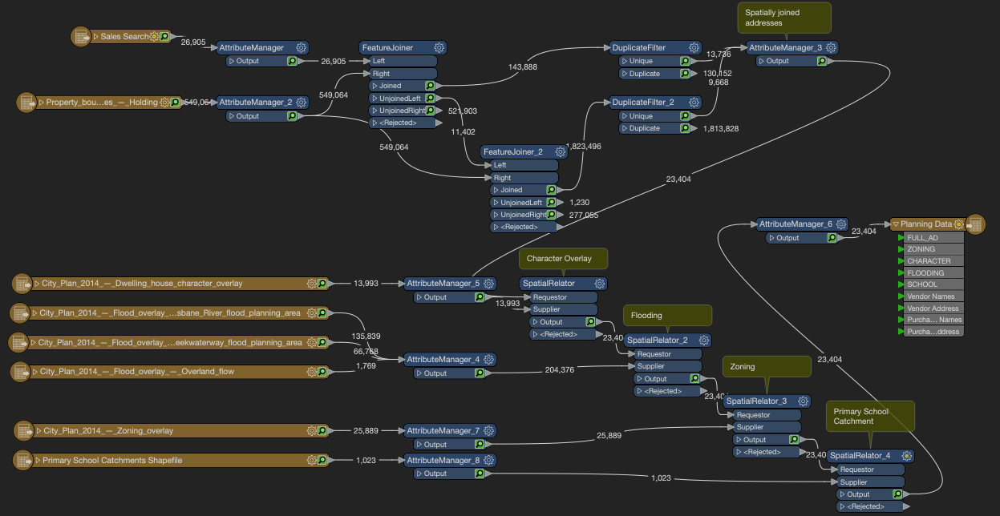

In [4]:
Image(filename='FME_PROCESS.png')

In [5]:
#Check the structure
df2 = pd.read_csv("Planning Data.csv")
df2.head()

,FULL_AD,ZONING,CHARACTER,FLOODING,SCHOOL,Vendor Names,Vendor Address,Purchaser Names,Purchaser Address
0,"38 DOWSE ST, PADDINGTON",Character residential (Infill housing),Character Residential,Not Flood Prone,Outside Primary School Catchment,EMMA LOUISE ROBERTSON,"2 PLUNKETT STREET, PADDINGTON, QLD, 4064, AUS",SCULL INVESTMENT FUND PTY LTD,"129 TOWERS STREET, ASCOT, QLD, 4007, AUS"
1,"33 NURRAN ST, MOUNT GRAVATT EAST",Low density residential,Character Residential,Flood Prone,Outside Primary School Catchment,PETER WILLIAM GEAR,"47A MACAULAY STREET, COORPAROO, QLD, 4151, AUS",XIAOHONG YANG; LONGBIN HUANG,"22 HANRAHAN STREET, ROBERTSON, QLD, 4109, AUS"
2,"155 EDENBROOKE DR, SEVENTEEN MILE ROCKS",Low density residential,Character Residential,Flood Prone,Outside Primary School Catchment,CHRISTOPHER JOHN & NAOMI JOY HICKS,"30 PETRIE WAY, IDALIA, QLD, 4811, AUS",HEINRICH VENTER,"155 EDENBROOKE DRIVE, SEVENTEEN MILE ROCKS, QL..."
3,"15 EDINBURGH CASTLE RD, KEDRON",Character residential (Character),Character Residential,Not Flood Prone,Outside Primary School Catchment,SIMON JAMES TATE; SUSAN CICELY PEARN,"20 ORMELEY STREET, STAFFORD HEIGHTS, QLD, 4053...",ALEXANDRA LAYNE & MADDISON ELIZABETH GEE,"15 EDINBURGH CASTLE ROAD, KEDRON, QLD, 4031, AUS"
4,"16 VENUS ST, ASHGROVE",Low density residential,Character Residential,Not Flood Prone,Outside Primary School Catchment,PAUL GORDON O`CONNOR; DIANNE HELEN MCCORMACK,"50 ROSEBERY STREET, CHELMER, QLD, 4068, AUS",BCN PROPERTY PTY LTD; GMJ PROPERTY (QLD) PTY L...,"47 BRISBANE STREET, ST LUCIA, QLD, 4067, AUS"


In [6]:
#Check the data available
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23404 entries, 0 to 23403
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   FULL_AD            23404 non-null  object
 1   ZONING             23398 non-null  object
 2   CHARACTER          23404 non-null  object
 3   FLOODING           23404 non-null  object
 4   SCHOOL             23404 non-null  object
 5   Vendor Names       23404 non-null  object
 6   Vendor Address     22555 non-null  object
 7   Purchaser Names    23404 non-null  object
 8   Purchaser Address  23398 non-null  object
dtypes: object(9)
memory usage: 1.6+ MB


In [7]:
#Create a field in df1 that allows for merging (same value) 
df1["FULL_AD"] = df1["Street Display"] + ", " + df1["Locality"]

In [8]:
#Merge the two datasets together
df = pd.merge(df1, df2, on = 'FULL_AD')
df.head()

,FULL_AD,FULL_AD2,Disclaimer,Building Name,Street Display,Alternate Street Display,Other,Unit,Number,Street Name,...,Purchaser Names_x,Purchaser Address_x,ZONING,CHARACTER,FLOODING,SCHOOL,Vendor Names_y,Vendor Address_y,Purchaser Names_y,Purchaser Address_y
0,"38 DOWSE ST, PADDINGTON","DOWSE ST, PADDINGTON",NaN,NaN,38 DOWSE ST,NaN,NaN,NaN,38.0,DOWSE ST,...,SCULL INVESTMENT FUND PTY LTD,"129 TOWERS STREET, ASCOT, QLD, 4007, AUS",Character residential (Infill housing),Character Residential,Not Flood Prone,Outside Primary School Catchment,EMMA LOUISE ROBERTSON,"2 PLUNKETT STREET, PADDINGTON, QLD, 4064, AUS",SCULL INVESTMENT FUND PTY LTD,"129 TOWERS STREET, ASCOT, QLD, 4007, AUS"
1,"33 NURRAN ST, MOUNT GRAVATT EAST","NURRAN ST, MOUNT GRAVATT EAST",NaN,NaN,33 NURRAN ST,NaN,NaN,NaN,33.0,NURRAN ST,...,XIAOHONG YANG; LONGBIN HUANG,"22 HANRAHAN STREET, ROBERTSON, QLD, 4109, AUS",Low density residential,Character Residential,Flood Prone,Outside Primary School Catchment,PETER WILLIAM GEAR,"47A MACAULAY STREET, COORPAROO, QLD, 4151, AUS",XIAOHONG YANG; LONGBIN HUANG,"22 HANRAHAN STREET, ROBERTSON, QLD, 4109, AUS"
2,"155 EDENBROOKE DR, SEVENTEEN MILE ROCKS","EDENBROOKE DR, SEVENTEEN MILE ROCKS",NaN,NaN,155 EDENBROOKE DR,NaN,NaN,NaN,155.0,EDENBROOKE DR,...,HEINRICH VENTER,"155 EDENBROOKE DRIVE, SEVENTEEN MILE ROCKS, QL...",Low density residential,Character Residential,Flood Prone,Outside Primary School Catchment,CHRISTOPHER JOHN & NAOMI JOY HICKS,"30 PETRIE WAY, IDALIA, QLD, 4811, AUS",HEINRICH VENTER,"155 EDENBROOKE DRIVE, SEVENTEEN MILE ROCKS, QL..."
3,"15 EDINBURGH CASTLE RD, KEDRON","EDINBURGH CASTLE RD, KEDRON",NaN,NaN,15 EDINBURGH CASTLE RD,NaN,NaN,NaN,15.0,EDINBURGH CASTLE RD,...,ALEXANDRA LAYNE & MADDISON ELIZABETH GEE,"15 EDINBURGH CASTLE ROAD, KEDRON, QLD, 4031, AUS",Character residential (Character),Character Residential,Not Flood Prone,Outside Primary School Catchment,SIMON JAMES TATE; SUSAN CICELY PEARN,"20 ORMELEY STREET, STAFFORD HEIGHTS, QLD, 4053...",ALEXANDRA LAYNE & MADDISON ELIZABETH GEE,"15 EDINBURGH CASTLE ROAD, KEDRON, QLD, 4031, AUS"
4,"16 VENUS ST, ASHGROVE","VENUS ST, ASHGROVE",NaN,NaN,16 VENUS ST,NaN,NaN,NaN,16.0,VENUS ST,...,BCN PROPERTY PTY LTD; GMJ PROPERTY (QLD) PTY L...,"47 BRISBANE STREET, ST LUCIA, QLD, 4067, AUS",Low density residential,Character Residential,Not Flood Prone,Outside Primary School Catchment,PAUL GORDON O`CONNOR; DIANNE HELEN MCCORMACK,"50 ROSEBERY STREET, CHELMER, QLD, 4068, AUS",BCN PROPERTY PTY LTD; GMJ PROPERTY (QLD) PTY L...,"47 BRISBANE STREET, ST LUCIA, QLD, 4067, AUS"


### Quick data perparations
As mentioned previously, the client was only interested in properties under $1,000,000 dollars. This makes the analysis more accurate anyway as the higher valued properties often have characteristics not considered by this analysis (e.g. Views, sentimental buying, significant architecture). In addition to this it was identifed taht some of the values in the "Days to Sell" field were negative (theoretically impossible) so they were changed to NaN values.

In [9]:
#To remove the sale prices above 1m we need to create a function that we then apply to the entire column
def above_1m(x):
    if(x > 1000000): 
        return float('NaN')
    else: 
        return x
    
def below_200k(x):
    if(x < 200000): 
        return float('NaN')
    else: 
        return x
    
df['Sale Price'] = df['Sale Price'].apply(above_1m)
df['Sale Price'] = df['Sale Price'].apply(below_200k)

In [10]:
#Client was worried about negative values in Days to Sell. Check this.
print("Negative values in Days To Sell? " + str((df['Days To Sell'] < 0).any().any()))

Negative values in Days To Sell? True


In [11]:
#Converts non-numeric data to NaN, overriding the errors. 
df['Days To Sell'] = df['Days To Sell'].apply(pd.to_numeric, errors='coerce')

#To remove the values with negative Days to sell (impossible) we use the following
def Selling_negative(x):
    if(x < 0): 
        return float('NaN')
    else: 
        return x
    
df['Days To Sell'] = df['Days To Sell'].apply(Selling_negative)

In [12]:
#Check to see if fix worked.
print("Still negative values in Days To Sell? " + str((df['Days To Sell'] < 0).any().any()))

Still negative values in Days To Sell? False


### Creating Analysis DF
Now that basic cleaning has been done we can create the new DF, harvesting the important data required. Note the SCHOOL dataset from df2 was dropped as it seemed to have been geospatially intersected incorrectly, all values returned outside of a school catchment, which is blatantly wrong.

In [13]:
#SCHOOL spatial analysis failed so this needs to be removed from analysis.
df["SCHOOL"].value_counts()

Outside Primary School Catchment    25683
Name: SCHOOL, dtype: int64

In [14]:
# Create new df_subset of data to be used for analysis
df_subset = df[['Sale Price', 'Locality', 'LGA', 'Days To Sell', 'Area', 'Bedrooms', 'Bathrooms', 'Car Parks', 'Valuation Amount', 'Property Type', 'ZONING', 'CHARACTER', 'FLOODING']]
df_subset.head()

,Sale Price,Locality,LGA,Days To Sell,Area,Bedrooms,Bathrooms,Car Parks,Valuation Amount,Property Type,ZONING,CHARACTER,FLOODING
0,930000.0,PADDINGTON,BCC-ITHACA,13.580000,191.0,3.0,2.0,1.0,520000.0,House,Character residential (Infill housing),Character Residential,Not Flood Prone
1,650000.0,MOUNT GRAVATT EAST,BCC-BELMONT,15.330000,607.0,3.0,1.0,1.0,475000.0,House,Low density residential,Character Residential,Flood Prone
2,690000.0,SEVENTEEN MILE ROCKS,BCC-SHERWOOD,84.540001,575.0,5.0,2.0,2.0,365000.0,House,Low density residential,Character Residential,Flood Prone
3,615000.0,KEDRON,BCC-KEDRON,9.680000,405.0,3.0,1.0,2.0,520000.0,House,Character residential (Character),Character Residential,Not Flood Prone
4,730000.0,ASHGROVE,BCC-ENOGGERA,6.500000,607.0,3.0,3.0,1.0,670000.0,House,Low density residential,Character Residential,Not Flood Prone


## Descriptive Analysis
Before analysing any data, its important to understand the variables we have available for analysis.

- __Sale Price__: Sale price is the variable which the model aims to predict. This is the value paid by the buyer for a property.
- __Locality__: Locality is a catagorical represents the suburb in which the property is within. This was a value of critical importance to the client.
- __LGA__: LGA is a catagorical variable, representing the Local Government Area the property is within.
- __Days to Sell__: Days to sell is the number of days the property was listed on the market before it sold.
- __Area__: Area represents the m2 of the property.
- __Bedrooms__: Bedrooms is the number of bedrooms the property has.
- __Bathrooms__: Bathrooms is the number of bedrooms the property has.
- __Car Parks__: Car Parks is the number of bedrooms the property has.
- __Valuation Amount__: Valuation amount is the government issued valuation of the unimporved land value. This is used by governments to determine rates land owners are required to pay.
- __Property Type__: Property type is a catagorical variable that outlines the type of property sold.
- __ZONING__: Zoning represents the council identified land zone, which has implications on what the site is able to be used for through development.
- __CHARACTER__: Character represents the planning concept of character residential. Character residential properties are identified by the local government as having significant character that is of value to the city. As such these properties have additional limitations around how they can be developed, and are also sought after by buyers for their unique character.
- __FLOODING__: Flooding represents any properties that are within the flooding overlay issued by the local government. This implies that they are prone to flooding. 

In order to better understand the data available, a few visualisations of have been created below. The first graph created was to get an idea of the distribution of properties within the selected 200,000 to 1,000,000 cap.

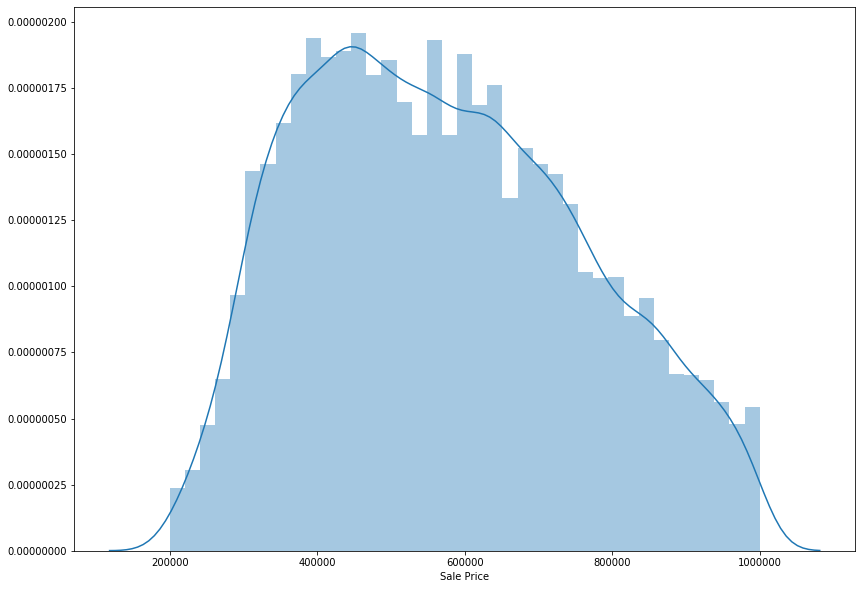

In [15]:
fig = plt.subplots(figsize= (14, 10))
sns.distplot(df_subset["Sale Price"], kde=True)
plt.show()

In the distribution it becomes clear that there is a slight left skew in our dataset. Here we can clearly see the data has been cut at the $200,000 and $1,000,000 Sale Price.

### Housing Type analysis
One of the key variables identified by the client was housing type. The client was of the opinion that housing type would have considerable impact on Sale price. Interestingly when graphed below, it is clear that the housing type does undoubtedly have a clear impact on Sale Price. For example, the housing type "House" has an average price much higher than that of a "Unit". 

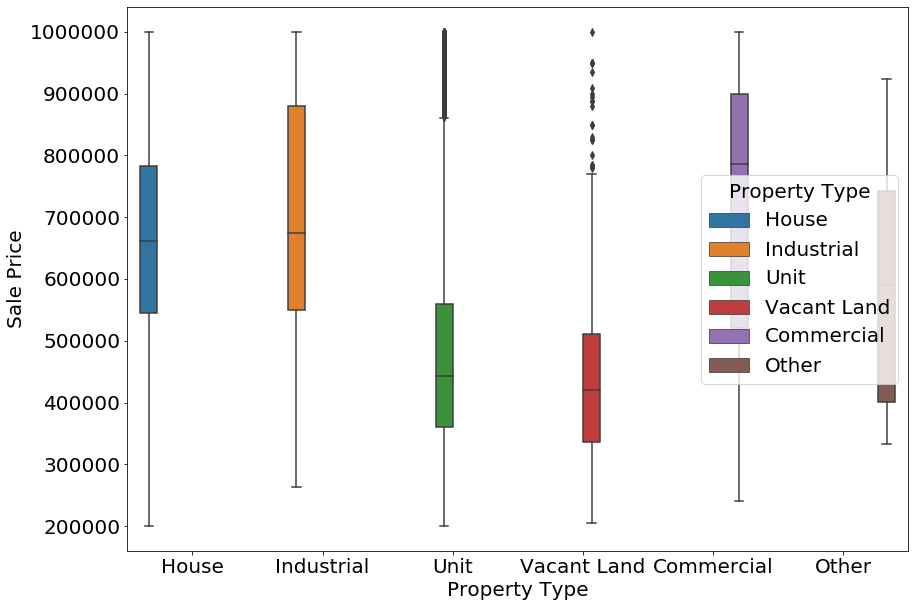

In [57]:
fig = plt.subplots(figsize= (14, 10))
sns.boxplot(x="Property Type", y="Sale Price", hue="Property Type", data=df_subset)
plt.show()

### Character analysis
The other key variables identified by the client was the impact of character on sale price. Interestingly when graphed below, based on the dataset used, it was determined that character housing did indeed have a average higher value overall compared with non character housing. 

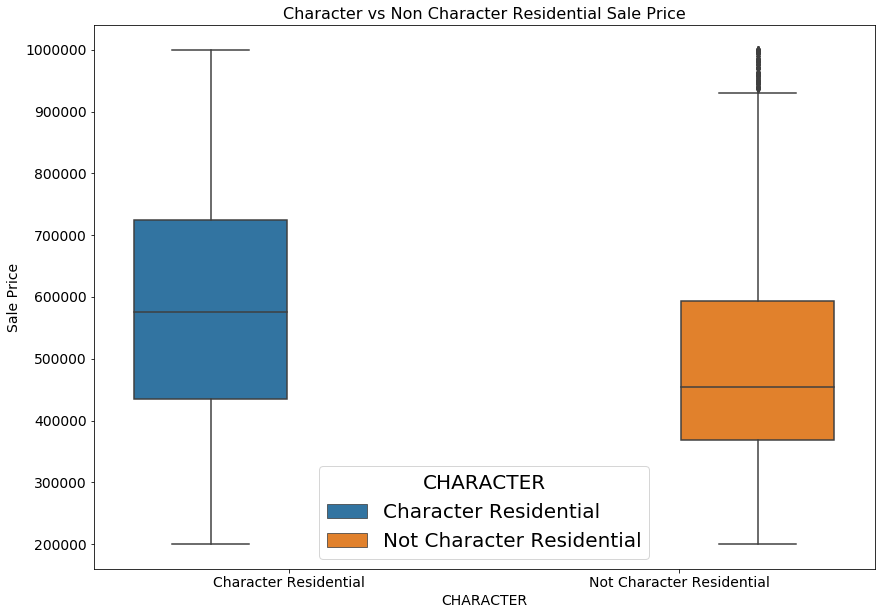

In [54]:
fig = plt.subplots(figsize= (14, 10))
font = {'size': 20}
plt.rc('font', **font)
plt.title("Character vs Non Character Residential Sale Price", fontsize=16)
sns.boxplot(x="CHARACTER", y="Sale Price", hue="CHARACTER", data=df_subset)
plt.show()

## Creating Dummy Variables
Now we have the data combined and cleaned and we have a little bit of an idea what it looks like, we need to create dummies for the catagorical variables in our dataset. These variables include:
- Property Type
- Locality
- ZONING
- CHARACTER
- FLOODING
- LGA

To do this we use the get_dummies function to change our values from words to simple 1's and 0's.

In [39]:
#Create dummies for Property Type
dummies1 = pd.get_dummies(df_subset['Property Type'])
dummies1.head()

,Commercial,House,Industrial,Other,Unit,Vacant Land
0,0,1,0,0,0,0
1,0,1,0,0,0,0
2,0,1,0,0,0,0
3,0,1,0,0,0,0
4,0,1,0,0,0,0


In [19]:
#Create dummies for Locality (Suburb)
dummies2 = pd.get_dummies(df_subset['Locality'])
dummies2.head()

,ACACIA RIDGE,ALBION,ALDERLEY,ALGESTER,ANNERLEY,ANSTEAD,ARCHERFIELD,ASCOT,ASHGROVE,ASPLEY,...,WILSTON,WINDSOR,WISHART,WOOLLOONGABBA,WOOLOOWIN,WYNNUM,WYNNUM WEST,YEERONGPILLY,YERONGA,ZILLMERE
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [20]:
#Create dummies for Zoning
dummies3 = pd.get_dummies(df_subset['ZONING'])
dummies3.head()

,Cemetery,Character residential (Character),Character residential (Infill housing),Community purposes,Conservation,Conservation (District),Conservation (Local),Conservation (Metropolitan),District centre (Corridor),District centre (District),...,Special purpose (Utility services),Specialised centre (Entertainment and conference centre),Specialised centre (Large format retail),Specialised centre (Major education and research facility),Specialised centre (Mixed industry and business),Sport and recreation,Sport and recreation (District),Sport and recreation (Local),Sport and recreation (Metropolitan),Township
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
#Create dummies for Character Residential
dummies4 = pd.get_dummies(df_subset['CHARACTER'])
dummies4.head()

,Character Residential,Not Character Residential
0,1,0
1,1,0
2,1,0
3,1,0
4,1,0


In [22]:
#Create dummies for Flooding
dummies5 = pd.get_dummies(df_subset['FLOODING'])
dummies5.head()

,Flood Prone,Not Flood Prone
0,0,1
1,1,0
2,1,0
3,0,1
4,0,1


In [23]:
#Create dummies for LGA
dummies6 = pd.get_dummies(df_subset['LGA'])
dummies6.head()

,BCC-BALMORAL,BCC-BELMONT,BCC-BRISBANE,BCC-COORPAROO,BCC-ENOGGERA,BCC-HAMILTON,BCC-ITHACA,BCC-KEDRON,BCC-MOGGILL,BCC-SANDGATE,BCC-SHERWOOD,BCC-SOUTH BRISBANE,BCC-STEPHENS,BCC-TARINGA,BCC-TINGALPA,BCC-TOOMBUL,BCC-TOOWONG,BCC-WINDSOR,BCC-WYNNUM,BCC-YEERONGPILLY
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [24]:
# Remove variables that we created dummies for so we can create final DF
df_subset_final = df_subset[['Sale Price', 'Days To Sell', 'Area', 'Bedrooms', 'Bathrooms', 'Car Parks', 'Valuation Amount']]
df_subset_final

,Sale Price,Days To Sell,Area,Bedrooms,Bathrooms,Car Parks,Valuation Amount
0,930000.0,13.580000,191.0,3.0,2.0,1.0,520000.0
1,650000.0,15.330000,607.0,3.0,1.0,1.0,475000.0
2,690000.0,84.540001,575.0,5.0,2.0,2.0,365000.0
3,615000.0,9.680000,405.0,3.0,1.0,2.0,520000.0
4,730000.0,6.500000,607.0,3.0,3.0,1.0,670000.0
...,...,...,...,...,...,...,...
25678,595000.0,NaN,597.0,3.0,1.0,2.0,465000.0
25679,620000.0,15.500000,630.0,4.0,2.0,2.0,375000.0
25680,880000.0,NaN,810.0,3.0,1.0,2.0,640000.0
25681,465000.0,NaN,99.0,1.0,1.0,1.0,0.0


## Brining together the final Dataframe
Following the creation and analysis of dummy variables, dummies and the original dataframe are combined together for further analysis and then model training. 

In [25]:
#Adding dummies to the df by concatenating variables to dataframe
df_dummy = pd.concat([df_subset_final, dummies1, dummies2, dummies3, dummies4, dummies5, dummies6], axis=1)
df_dummy = df_dummy.dropna() #Get rid of rows with empty cells
df_dummy.head()

,Sale Price,Days To Sell,Area,Bedrooms,Bathrooms,Car Parks,Valuation Amount,Commercial,House,Industrial,...,BCC-SHERWOOD,BCC-SOUTH BRISBANE,BCC-STEPHENS,BCC-TARINGA,BCC-TINGALPA,BCC-TOOMBUL,BCC-TOOWONG,BCC-WINDSOR,BCC-WYNNUM,BCC-YEERONGPILLY
0,930000.0,13.580000,191.0,3.0,2.0,1.0,520000.0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,650000.0,15.330000,607.0,3.0,1.0,1.0,475000.0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,690000.0,84.540001,575.0,5.0,2.0,2.0,365000.0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
3,615000.0,9.680000,405.0,3.0,1.0,2.0,520000.0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,730000.0,6.500000,607.0,3.0,3.0,1.0,670000.0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


Before we analyse the corrolations for any of the variables in our sample, it was decided that we should investigate the mean and median values for Sale Price.

In [26]:
mean_size = round(df_dummy['Sale Price'].mean(),2)
median_size = round(df_dummy['Sale Price'].median(),2)
print(f'The median Sale Price of the sample is: $ {median_size} AUD')
print(f'The mean Sale Price of the sample is: $ {mean_size} AUD')

The median Sale Price of the sample is: $ 581000.0 AUD
The mean Sale Price of the sample is: $ 591180.11 AUD


### Understanding Correlations within the data
One of the key areas of interest for the client was to understand the relationship between variables within the sample. The client was interested in understanding if there were any clear corrolations for future analysis. 

To begin with we will look at corr1. This essentially contains everything except locality. To do this we will create a correlation matrix as well as a heatmap to visualise this data.

In [27]:
corr1 = df_dummy[['Sale Price', 'Days To Sell', 'Area', 'Bedrooms', 'Bathrooms', 'Car Parks', 'Valuation Amount', 'Commercial', 'House', 'Industrial', 'Unit', 'Character Residential', 'Not Character Residential', 'Flood Prone', 'Not Flood Prone']].corr()
corr1

,Sale Price,Days To Sell,Area,Bedrooms,Bathrooms,Car Parks,Valuation Amount,Commercial,House,Industrial,Unit,Character Residential,Not Character Residential,Flood Prone,Not Flood Prone
Sale Price,1.000000,-0.125417,0.200386,0.547084,0.330922,0.363210,0.719075,0.009518,0.573493,0.009908,-0.574516,0.177655,-0.177655,-0.055980,0.055980
Days To Sell,-0.125417,1.000000,-0.001915,-0.041066,0.034904,-0.026572,-0.117035,0.068284,-0.117574,0.011617,0.112628,-0.096150,0.096150,0.043936,-0.043936
Area,0.200386,-0.001915,1.000000,0.183909,0.050453,0.214355,0.244739,0.019084,0.250414,0.000167,-0.251703,-0.118652,0.118652,0.035989,-0.035989
Bedrooms,0.547084,-0.041066,0.183909,1.000000,0.541811,0.458029,0.514685,0.012560,0.567084,-0.017402,-0.567808,0.237767,-0.237767,-0.174621,0.174621
Bathrooms,0.330922,0.034904,0.050453,0.541811,1.000000,0.275380,0.040566,-0.005979,0.038176,-0.010040,-0.037367,0.009546,-0.009546,-0.045726,0.045726
Car Parks,0.363210,-0.026572,0.214355,0.458029,0.275380,1.000000,0.353060,0.063736,0.388387,0.009964,-0.392641,0.107837,-0.107837,-0.081479,0.081479
Valuation Amount,0.719075,-0.117035,0.244739,0.514685,0.040566,0.353060,1.000000,0.012092,0.887249,0.003509,-0.889036,0.294620,-0.294620,-0.176313,0.176313
Commercial,0.009518,0.068284,0.019084,0.012560,-0.005979,0.063736,0.012092,1.000000,-0.035885,-0.000515,-0.020226,-0.010191,0.010191,0.029622,-0.029622
House,0.573493,-0.117574,0.250414,0.567084,0.038176,0.388387,0.887249,-0.035885,1.000000,-0.025370,-0.996691,0.310916,-0.310916,-0.192177,0.192177
Industrial,0.009908,0.011617,0.000167,-0.017402,-0.010040,0.009964,0.003509,-0.000515,-0.025370,1.000000,-0.014299,-0.007205,0.007205,-0.001564,0.001564


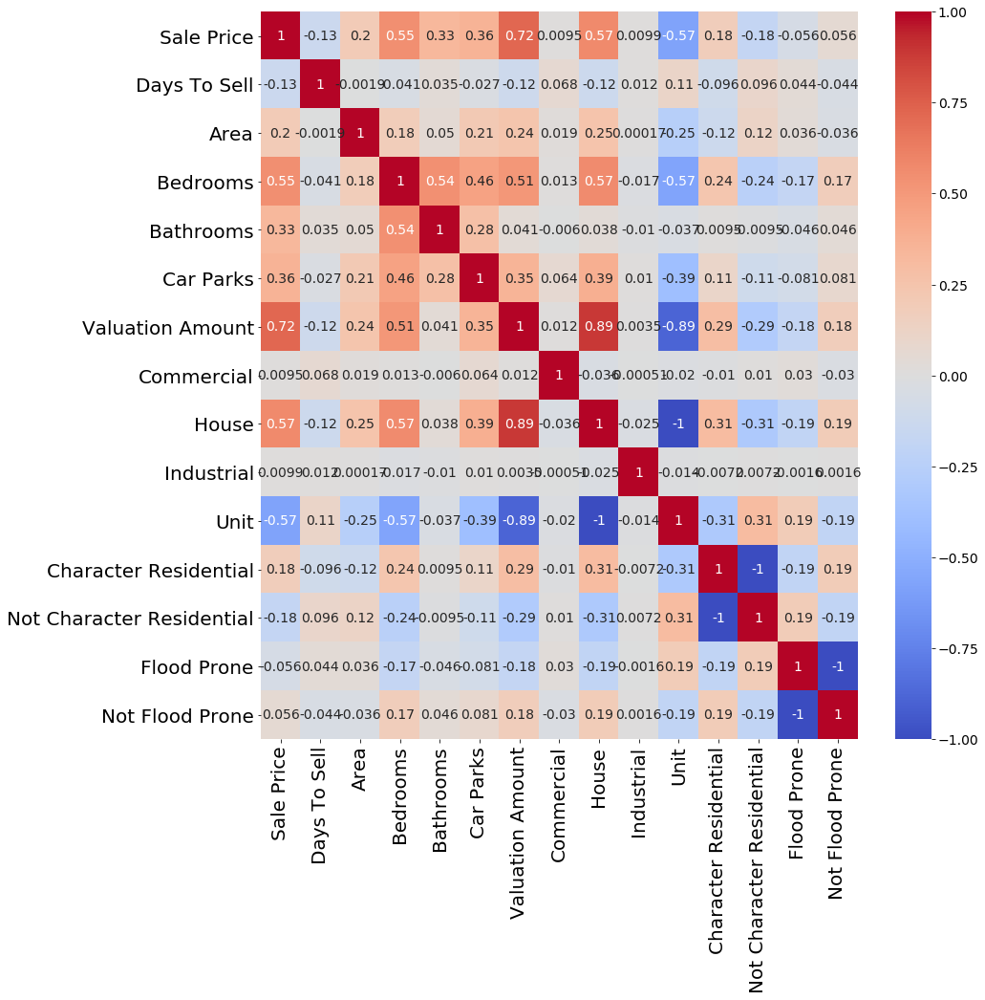

In [28]:
# Plot the correlation heatmap to determine variables of use
plt.subplots(figsize=(14, 14))
font = {'size': 14}
plt.rc('font', **font)
sns.heatmap(corr1, xticklabels=corr1.columns,cmap='coolwarm', yticklabels=corr1.columns,annot=True)
plt.show()

With the visualisations above, we can see that there are a few values that have an intersting correlation with Sales Price. For example, logically, valuation amount has a corelation of .72 to Sale price. Considering that this is essentially an estimate of Sale price made by government, this is unsurprising. Other key variables were also relatively expected. For example, bedrooms and Housing type (both Unit and House) were expected to be important variables for Sale price, which was confirmed by the analysis above. Intersting, variables such as flooding had a surprisingly small corrolation to sale price. Instinctivly you would assume that flooding would have a negative correlation to sale price. However, consider the fact that this could be explained by riverside property, something that is highly sought after in Brisbane, despite the flood risks. 

The second set of correlations was purely related to locality (or subrub). The client was intersted in understanding the impact of locality on Sales price. In order to clearly visualise this, the correlation was split from the previous. Due to the huge number of suburbs included in Brisbane, the heatmap may take some time to load and is best viewed as a saved IMG file.

In [29]:
# Check to see if corr with locality is worthwhile consideration
dummies2andSP = pd.concat([df_subset_final["Sale Price"], dummies2], axis=1)
corr2 = dummies2andSP.corr()
corr2

,Sale Price,ACACIA RIDGE,ALBION,ALDERLEY,ALGESTER,ANNERLEY,ANSTEAD,ARCHERFIELD,ASCOT,ASHGROVE,...,WILSTON,WINDSOR,WISHART,WOOLLOONGABBA,WOOLOOWIN,WYNNUM,WYNNUM WEST,YEERONGPILLY,YERONGA,ZILLMERE
Sale Price,1.000000,-0.065482,-0.003962,0.027114,-0.035545,0.002789,0.024019,-0.023304,-0.016852,0.042884,...,0.016607,-0.002503,0.025820,-0.028305,0.002101,0.023729,-0.024687,-0.008217,0.011613,-0.071643
ACACIA RIDGE,-0.065482,1.000000,-0.004042,-0.005537,-0.005402,-0.007261,-0.001993,-0.002095,-0.006520,-0.007290,...,-0.004145,-0.005889,-0.005499,-0.005798,-0.004220,-0.008950,-0.007449,-0.003169,-0.006221,-0.006187
ALBION,-0.003962,-0.004042,1.000000,-0.004173,-0.004071,-0.005472,-0.001502,-0.001579,-0.004914,-0.005494,...,-0.003124,-0.004438,-0.004144,-0.004370,-0.003180,-0.006746,-0.005614,-0.002388,-0.004688,-0.004663
ALDERLEY,0.027114,-0.005537,-0.004173,1.000000,-0.005578,-0.007497,-0.002057,-0.002163,-0.006732,-0.007527,...,-0.004279,-0.006080,-0.005678,-0.005987,-0.004357,-0.009241,-0.007691,-0.003272,-0.006423,-0.006388
ALGESTER,-0.035545,-0.005402,-0.004071,-0.005578,1.000000,-0.007314,-0.002007,-0.002110,-0.006568,-0.007343,...,-0.004175,-0.005932,-0.005539,-0.005841,-0.004251,-0.009016,-0.007503,-0.003192,-0.006266,-0.006232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WYNNUM,0.023729,-0.008950,-0.006746,-0.009241,-0.009016,-0.012118,-0.003326,-0.003496,-0.010882,-0.012166,...,-0.006917,-0.009828,-0.009177,-0.009677,-0.007043,1.000000,-0.012432,-0.005289,-0.010382,-0.010325
WYNNUM WEST,-0.024687,-0.007449,-0.005614,-0.007691,-0.007503,-0.010085,-0.002768,-0.002910,-0.009056,-0.010125,...,-0.005757,-0.008179,-0.007638,-0.008053,-0.005861,-0.012432,1.000000,-0.004401,-0.008640,-0.008593
YEERONGPILLY,-0.008217,-0.003169,-0.002388,-0.003272,-0.003192,-0.004290,-0.001177,-0.001238,-0.003853,-0.004307,...,-0.002449,-0.003480,-0.003249,-0.003426,-0.002494,-0.005289,-0.004401,1.000000,-0.003676,-0.003656
YERONGA,0.011613,-0.006221,-0.004688,-0.006423,-0.006266,-0.008422,-0.002311,-0.002430,-0.007563,-0.008456,...,-0.004808,-0.006831,-0.006379,-0.006726,-0.004895,-0.010382,-0.008640,-0.003676,1.000000,-0.007176


Again, the use of a heatmap helps us more clearly identify any significant correlations.

In [58]:
# Plot the correlation heatmap to determine variables of use
plt.subplots(figsize=(200, 200)) #Figsize is massive to account for huge number of variables.
sns.heatmap(corr2, xticklabels=corr2.columns,cmap='coolwarm', yticklabels=corr2.columns,annot=True)
plt.show()

Interestingly again, suburb seems to have minimal correlation to Sale Price. This was unexpected, however again could be explained by the existing diversity of housing stock, and rapid urbanisation occuring across Brisbane. 

# Creating the Random Forest Regression Model

This section is about building the model to predict Sale Price. To do this, it was determined that the use of Random Forest would be appropriate. Random forest is a type of supervised machine learning. The logic of random forest is to use multiple decision trees to determine an output. For the purposes of this algorithm the number of trees used will be 1000. Once we have trained the model, outputs (predictions) will essentially be the result of a voting process, determined through training. The code below splits the data into a test set and a training set (using the typical 0.3 test size), and trains the model using the Random Forest Regressor.

In [31]:
X = df_dummy.loc[:,'Days To Sell':'BCC-YEERONGPILLY'] 
y = df_dummy['Sale Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [32]:
rf = RandomForestRegressor(n_estimators= 1000)
rf = rf.fit(X_train, y_train)

In [33]:
y_pred = rf.predict(X_test) #the predicted values

### Model Evaluation
With the model trained, lets being evaluation by looking at a graph comparing the predicted vs actual sales price, as wellas calculating the $ R^2 $ score and the Root Mean Squared Error.

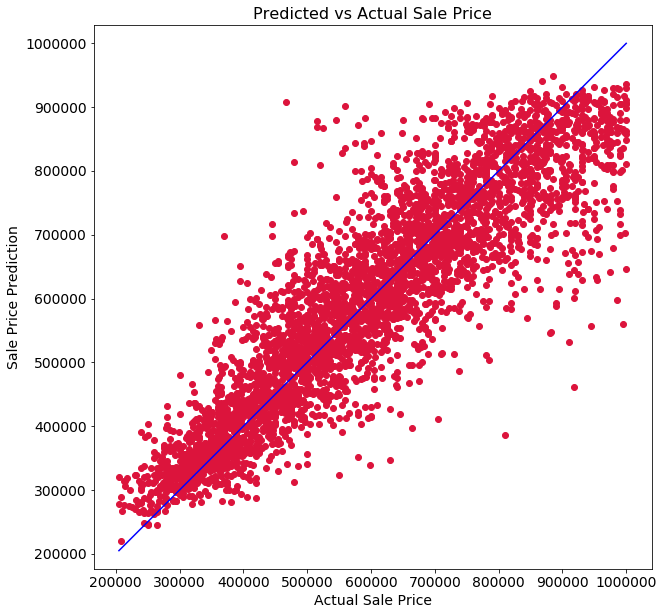

In [34]:
plt.figure(figsize=(10,10))
plt.scatter(y_test, y_pred, c='crimson')

p1 = max(max(y_pred), max(y_test))
p2 = min(min(y_pred), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.title("Predicted vs Actual Sale Price", fontsize=16)
plt.xlabel('Actual Sale Price', fontsize=14)
plt.ylabel('Sale Price Prediction', fontsize=14)
plt.axis('equal')
plt.show()

From this graph we can see that generally speaking the moel is pretty good at predicting the sale price. The model clearly picks along what would be expected. By eye, it seems as though as the sale prices increase in value the predictions start underestimating value.

However the accuracy of this model, we can investigate further. To do this lets start with the rf.score function.

In [51]:
round(rf.score(X_test, y_test),2)

0.8

Our model has an $ R^2 $ score of 0.8 which is good. The $ R^2 $ value essentailly explains the fit of the model to the data. $ R^2 $ is calculated as follows. $ R^2 = 1 - \frac{RSS}{TSS} $ where RSS is the sum of the squared residuals and TSS is the total sum of squares. This means that in this scenario the model is able to explain 80% of the relationship.

Another key value that needs to be calculated is the Root Mean Squared Error (RSME). RSME is a measure of the difference of values predicted verses the observed values (actual values). Essentially, it shows close the model is able to predict the actual values. RSME is calculated as follows. $ \sqrt{\frac{\sum{(\hat{y} - y)^2}}{N}} $ where $ \hat{y} $ is the predicted value, $ y $ is the observed value and $ N $ is the number of data points.

In [52]:
y_test_p = rf.predict(X_test)
round(math.sqrt(mean_squared_error(y_test, y_test_p)),2)

83583.95

Based on the Root Mean Squared Error the model has a typical error of $83583.95 AUD. 

Considering the mean sale price of $591180.11 AUD, the RMSE represents an error of roughly 14.1%. 

Overall, from a purchasing perspective this probably means that the model needs further refining, however on a conceptual level this model is a great first attempt for the client to build upon.

### Building a different Algorithm
In order to see if a different algorithm fits our data better, we will use a linear regression model. If we test the $ R^2 $ score again we get a value of .75 and our RMSE value is at 94,388.19. 

In [41]:
lm = LinearRegression() #create the model
model = lm.fit(X_train, y_train) #train the model

In [49]:
y_test_p = lm.predict(X_test) #Generate predictions for the test data. So we use X.test, not X.train
round(r2_score(y_test, y_test_p),2)

0.75

In [50]:
round(math.sqrt(mean_squared_error(y_test, y_test_p)),2)

94388.19

In this instance it seems as though the linear regression is not as accurate at predicting sale price with the model only able to explain 75% of the variation. The RMSE value means that the predictions are typically off by $94,388.19 AUD. 